# 1. Imports
Nothing interesting here. 💤💤💤💤💤💤💤💤💤💤💤💤💤💤💤 ok stop sleeping there is also the rest of the notebook to walkthrough😜

In [1]:
!pip install -q efficientnet|||
from efficientnet.tfkeras import *

/bin/sh: 1: Syntax error: "|" unexpected


In [2]:
# Efficientnet stuff
import efficientnet.tfkeras as efn
# Tensorflow Stuff
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Input, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard, ReduceLROnPlateau
import tensorflow as tf
import tensorflow.keras.backend as K
# Data Splitting Stuff
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold
# Image Handler Stuff
import matplotlib.pyplot as plt
import cv2
# Array Handler Stuff
import numpy as np
# Other stuff
import os
from tqdm import tqdm as tqdm
from functools import partial
import math
import re
from matplotlib import pyplot as plt
import math, os, re, gc
import numpy as np, pandas as pd
from sklearn.metrics import classification_report, accuracy_score

#deep learning basics
import tensorflow as tf
import tensorflow.keras.backend as K

Bunccha good ideas - 

https://www.kaggle.com/tuckerarrants/cassava-tensorflow-starter-training on mixup
https://www.kaggle.com/dimitreoliveira/cassava-leaf-supervised-contrastive-learning on contrastive learning

Good article - 
https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/#keras-implementation-of-efficientnet

# 2. TPU SETUP

Here are some excellent notebooks to refer - 
https://www.kaggle.com/awsaf49/efficientnetb6-512-cutmixupdropout-tpu-train

https://www.kaggle.com/jessemostipak/getting-started-tpus-cassava-leaf-disease/data

https://www.kaggle.com/dimitreoliveira/cassava-leaf-disease-training-with-tpu-v2-pods/notebook

https://www.kaggle.com/dimitreoliveira/cassava-leaf-disease-tpu-tensorflow-training

Other good notebooks but on gpu - 

https://www.kaggle.com/frlemarchand/efficientnet-aug-tf-keras-for-cassava-diseases

In [3]:
# UNCOMMENT THE FOLLOWING CODE TO RUN ON TPU AUTOMATICALLY CONNECTS TO TPU

DEVICE = None   #or GPU

if DEVICE == "TPU":
    print("connecting to TPU...")
    try:
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        print('Running on TPU ', tpu.master())
    except ValueError:
        print("Could not connect to TPU")
        tpu = None

    if tpu:
        try:
            print("initializing  TPU ...")
            tf.config.experimental_connect_to_cluster(tpu)
            tf.tpu.experimental.initialize_tpu_system(tpu)
            strategy = tf.distribute.experimental.TPUStrategy(tpu)
            print("TPU initialized")
        except _:
            print("failed to initialize TPU")
    else:
        DEVICE = "GPU"

if DEVICE != "TPU":
    print("Using default strategy for CPU and single GPU")
    strategy = tf.distribute.get_strategy()

if DEVICE == "GPU":
    print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
    

AUTO = tf.data.experimental.AUTOTUNE
REPLICAS = strategy.num_replicas_in_sync
print(f'REPLICAS: {REPLICAS}')

Using default strategy for CPU and single GPU
REPLICAS: 1


Some setup variables

In [4]:
AUTO = tf.data.experimental.AUTOTUNE
HEIGHT = 512
WIDTH = 512
CHANNELS = 3
N_CLASSES = 5
CLASSES = ['0', '1', '2', '3', '4']
SEED = 34 
IMAGE_SIZE = [512, 512]
BATCH_SIZE = 16 * REPLICAS 
AUG_BATCH = 2 * BATCH_SIZE
FOLDS = 5
VERBOSE = 1
FIRST_FOLD_ONLY = False
AUG_TYPE = 'CUTMIXUP'

The GCS Path thingy stuff explaination-

**TPUs read data directly from Google Cloud Storage (GCS), so we actually need to copy our dataset to a GCS 'bucket' that is near or 'co-located' with the TPU. The below chunk of code accomplishes this using the handy KaggleDatasets:**

In [5]:
from kaggle_datasets import KaggleDatasets
GCS_PATH = KaggleDatasets().get_gcs_path(f'cassava-leaf-disease-tfrecords-{IMAGE_SIZE[0]}x{IMAGE_SIZE[0]}')
GCS_PATH_ORG = KaggleDatasets().get_gcs_path('cassava-leaf-disease-classification')

print(GCS_PATH, GCS_PATH_ORG)       #can use these in Colab notebook

gs://kds-cbf542424fd55a044fc0ccf9bef477755c8634c141ccf400fb8993a3 gs://kds-8a8a0e757020ef17f93b37a540d540ccfa0003dbd9620ed6ef47ea9b


# 3. Loading in our data functions

Some excellent notebooks on tfrecords

https://www.kaggle.com/ryanholbrook/tfrecords-basics

We are gonna load our data via tfrecords. Now tfrecords as tensorflow suggests is best to feed data to a TPU. So we are gonna go with that.🙂

 ### a. Decode Image Function and Stuff
The following is a decoding function what it does is takes in an image in jpg form and converts it into an array.

In [6]:
#decodes and converts image to float in [0,1]
def decode_image(image_data):
    image = tf.image.decode_jpeg(image_data, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    #TPU needs to be explicitly told image size
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

### b. Read tfrecord

Basically reads our tfrecord file. Handles for labelled images.

In [30]:
def read_labeled_tfrecord(example):
    LABELED_TFREC_FORMAT = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "target": tf.io.FixedLenFeature([], tf.int64),  # shape [] means single element
    }
    example = tf.io.parse_single_example(example, LABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    label = tf.cast(example['target'], tf.int32)
    
    #returns a dataset of (image, label) pairs
    return image, label

Basically reads our tfrecord file. Handles for unlabelled images.

In [8]:
def read_unlabeled_tfrecord(example, return_image_name):
    UNLABELED_TFREC_FORMAT = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "id": tf.io.FixedLenFeature([], tf.string),  # [] means single entry
    }
    
    example = tf.io.parse_single_example(example, UNLABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    idnum = example['id']
    #returns a dataset of image(s)
    return image, idnum if return_image_name else 0

Following Just counts our data

In [9]:
def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

### C. The get dataset function - 

First we read the tfrecord files as a TFRecordDataset. Then what ds.repeat does it repeats our data infinite times. Then we shuffle the data and read our tfrecords if labelled then using the labelled tfrecord function and if not then using the unlabelled tf record function. The ds.map simply applies the function to our dataset and the num_parallel_calls just simply parallizes our task on tpu. Next are bunccha if statements just to show specific augmentations. Only the all_aug and mixup we will be using. Then one hot is just to one hot our arrays.

In [10]:
def get_dataset(files, course_drop = False, grid_mask = False, aug = False, cutmixup = False, one_hot = False,
                all_aug = False, shuffle = False, repeat = False, labeled = True, return_image_names = True,
                batch_size = BATCH_SIZE, dim = IMAGE_SIZE[0]):
   
    ds = tf.data.TFRecordDataset(files, num_parallel_reads=AUTO)

    if repeat:
        ds = ds.repeat()
    
    if shuffle: 
        ds = ds.shuffle(2048)
        opt = tf.data.Options()
        opt.experimental_deterministic = False
        ds = ds.with_options(opt)
        
    if labeled: 
        ds = ds.map(read_labeled_tfrecord, num_parallel_calls=AUTO)
    else:
        ds = ds.map(lambda example: read_unlabeled_tfrecord(example, return_image_names), 
                    num_parallel_calls=AUTO)  
        
    #apply course drop
    if course_drop:
        ds = ds.map(data_augment, num_parallel_calls = AUTO)
        ds = ds.map(lambda img, label: (dropout(img), label), num_parallel_calls = AUTO)
    
    #apply grid mask
    if grid_mask:
        ds = ds.map(data_augment, num_parallel_calls = AUTO)
        ds = ds.map(apply_grid_mask, num_parallel_calls = AUTO)
    
    #apply rot/shear/zoom augmentation
    if aug:
        ds = ds.map(data_augment, num_parallel_calls = AUTO)
        # ds = ds.map(transform, num_parallel_calls = AUTO)
     
    #apply all the above aug
    if all_aug:
        ds = ds.map(data_augment, num_parallel_calls = AUTO)
        ds = ds.map(apply_all_aug, num_parallel_calls = AUTO)
        
    
    #apply CutMix/MixUp combination
    if cutmixup:
        #ds = ds.map(data_augment, num_parallel_calls = AUTO)
        
        #need to batch to use CutMix/mixup
        ds = ds.batch(AUG_BATCH)
        ds = ds.map(cut_and_mix, num_parallel_calls = AUTO)
        
        #now unbatch and shuffle before re-batching
        ds = ds.unbatch()
        ds = ds.shuffle(2048)

    if one_hot:
        ds = ds.map(onehot, num_parallel_calls = AUTO)

    ds = ds.batch(batch_size)
    ds = ds.prefetch(AUTO)
    
    return ds

The tf.io.gfile.glob is used to read our paths to the tfrecord bucket
Next we are counting the data.
Then the steps per epoch as what i think is used when you use the tf.repeat and make your dataset infinitely long so to limit stuff we keep that. I am not sure at all. But yeah it is needed.

In [11]:
TRAINING_FILENAMES =  tf.io.gfile.glob(GCS_PATH + '/*.tfrec')
TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH_ORG + '/test_tfrecords/ld_test*.tfrec')

NUM_TRAINING_IMAGES = int( count_data_items(TRAINING_FILENAMES) * (FOLDS-1.)/FOLDS )
NUM_VALIDATION_IMAGES = int( count_data_items(TRAINING_FILENAMES) * 1/FOLDS )
NUM_TEST_IMAGES = count_data_items(TEST_FILENAMES)

STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE

print(f'Dataset: {NUM_TRAINING_IMAGES} training images, {NUM_VALIDATION_IMAGES} validation images, {NUM_TEST_IMAGES} (unlabeled) test images')

Dataset: 17116 training images, 4279 validation images, 1 (unlabeled) test images


# 4. Defining augmentation functions and  Visualization

**Now that we have dealt with all the configuring required to use TPUs, we can extract our images from the TPU and finally get a look at our data:**

In [12]:
np.set_printoptions(threshold=15, linewidth=80)

classes = ['0', '1', '2', '3', '4']          

def batch_to_numpy_images_and_labels(data):
    images, labels = data
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    if numpy_labels.dtype == object: 
        numpy_labels = [None for _ in enumerate(numpy_images)]
    return numpy_images, numpy_labels

def title_from_label_and_target(label, correct_label):
    if correct_label is None:
        return CLASSES[label], True
    correct = (label == correct_label)
    return "{} [{}{}{}]".format(CLASSES[label], 'OK' if correct else 'NO', u"\u2192" if not correct else '',
                                CLASSES[correct_label] if not correct else ''), correct

def display_one_plant(image, title, subplot, red=False, titlesize=16):
    plt.subplot(*subplot)
    plt.axis('off')
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize) if not red else int(titlesize/1.2), color='red' if red else 'black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)

def display_batch_of_images(databatch, predictions=None):
    images, labels = batch_to_numpy_images_and_labels(databatch)
    if labels is None:
        labels = [None for _ in enumerate(images)]
        
    rows = int(math.sqrt(len(images)))
    cols = len(images)//rows
    
    FIGSIZE = 13.0
    SPACING = 0.1
    subplot=(rows,cols,1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE,FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols,FIGSIZE))
    
    # display
    for i, (image, label) in enumerate(zip(images[:rows*cols], labels[:rows*cols])):
        title = '' if label is None else classes[label]
        correct = True
        if predictions is not None:
            title, correct = title_from_label_and_target(predictions[i], label)
        dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols)*40+3
        subplot = display_one_plant(image, title, subplot, not correct, titlesize=dynamic_titlesize)
    
    #layout
    plt.tight_layout()
    if label is None and predictions is None:
        plt.subplots_adjust(wspace=0, hspace=0)
    else:
        plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()

In [13]:
training_dataset = get_dataset(TRAINING_FILENAMES, labeled=True, course_drop=False, all_aug=False,
                               grid_mask=False, cutmixup=False, shuffle=True, repeat=True)
training_dataset = training_dataset.unbatch().batch(10)
train_batch = iter(training_dataset)

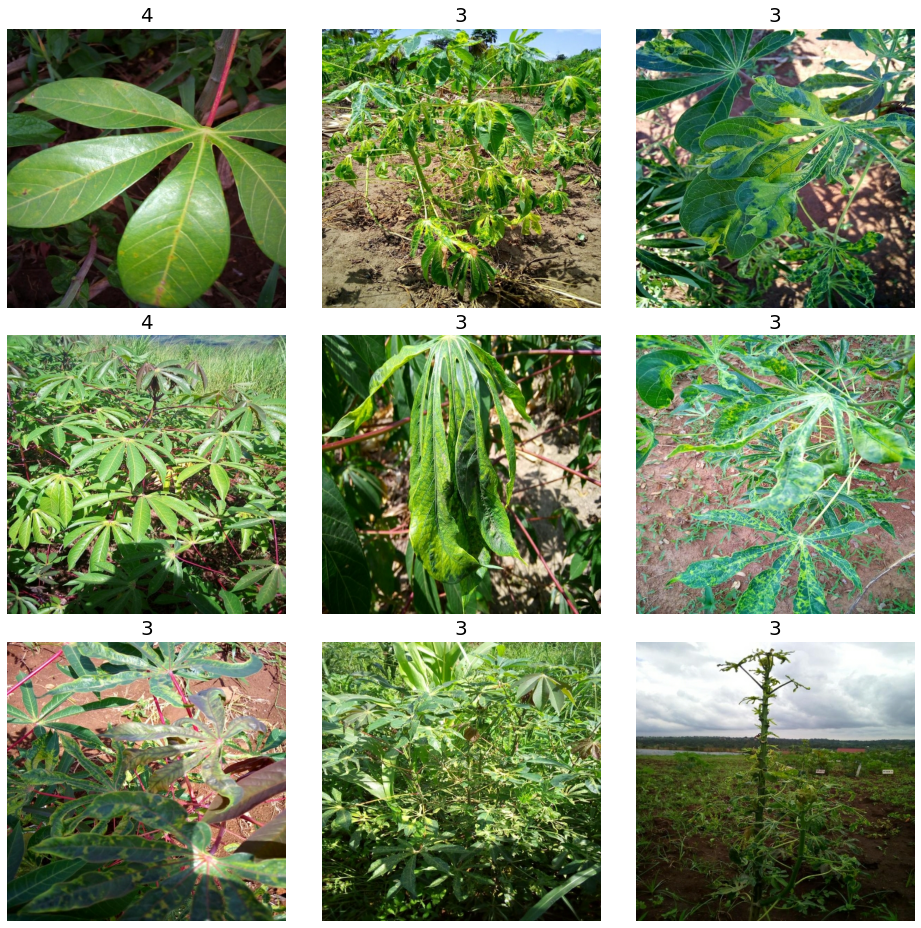

In [22]:
# run this cell again for another randomized set of training images
display_batch_of_images(next(train_batch))

# III. Augmentation

**Note: the following augmentation implementation is taken from [Chris Deotte](https://www.kaggle.com/cdeotte)'s notebook, which can be found [here](https://www.kaggle.com/cdeotte/cutmix-and-mixup-on-gpu-tpu)**

## Rotation, Shift, Zoom, Shear

In [ ]:
# def get_mat(rotation, shear, height_zoom, width_zoom, height_shift, width_shift):

#     rotation = math.pi * rotation / 180.
#     shear = math.pi * shear / 180.
    
#     c1 = tf.math.cos(rotation)
#     s1 = tf.math.sin(rotation)
#     one = tf.constant([1],dtype='float32')
#     zero = tf.constant([0],dtype='float32')
#     rotation_matrix = tf.reshape( tf.concat([c1,s1,zero, -s1,c1,zero, zero,zero,one],axis=0),[3,3] )

#     c2 = tf.math.cos(shear)
#     s2 = tf.math.sin(shear)
#     shear_matrix = tf.reshape( tf.concat([one,s2,zero, zero,c2,zero, zero,zero,one],axis=0),[3,3] )    

#     zoom_matrix = tf.reshape( tf.concat([one/height_zoom,zero,zero, zero,one/width_zoom,zero, zero,zero,one],axis=0),[3,3] )
    
#     shift_matrix = tf.reshape( tf.concat([one,zero,height_shift, zero,one,width_shift, zero,zero,one],axis=0),[3,3] )
    
#     return K.dot(K.dot(rotation_matrix, shear_matrix), K.dot(zoom_matrix, shift_matrix))

In [ ]:
# def transform(image, label, DIM = IMAGE_SIZE[0]):

#     XDIM = DIM % 2
    
#     rot = 15. * tf.random.normal([1],dtype='float32')
#     shr = 5. * tf.random.normal([1],dtype='float32') 
#     h_zoom = 1.0 + tf.random.normal([1],dtype='float32')/10.
#     w_zoom = 1.0 + tf.random.normal([1],dtype='float32')/10.
#     h_shift = 16. * tf.random.normal([1],dtype='float32') 
#     w_shift = 16. * tf.random.normal([1],dtype='float32') 

#     m = get_mat(rot,shr,h_zoom,w_zoom,h_shift,w_shift) 

#     x = tf.repeat( tf.range(DIM//2,-DIM//2,-1), DIM )
#     y = tf.tile( tf.range(-DIM//2,DIM//2),[DIM] )
#     z = tf.ones([DIM*DIM],dtype='int32')
#     idx = tf.stack( [x,y,z] )
    
#     idx2 = K.dot(m,tf.cast(idx,dtype='float32'))
#     idx2 = K.cast(idx2,dtype='int32')
#     idx2 = K.clip(idx2,-DIM//2+XDIM+1,DIM//2)
           
#     idx3 = tf.stack( [DIM//2-idx2[0,], DIM//2-1+idx2[1,]] )
#     d = tf.gather_nd(image,tf.transpose(idx3))
        
#     return tf.reshape(d,[DIM,DIM,3]),label

In [14]:
def data_augment(image, label, DIM = IMAGE_SIZE[0]):
    p_rotation = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_pixel_1 = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_pixel_2 = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_pixel_3 = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_shear = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_cutout = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    # Shear
    if p_shear > .2:
        if p_shear > .6:
            image = transform_shear(image, HEIGHT, shear=20.)
        else:
            image = transform_shear(image, HEIGHT, shear=-20.)
            
    # Rotation
    if p_rotation > .2:
        if p_rotation > .6:
            image = transform_rotation(image, HEIGHT, rotation=45.)
        else:
            image = transform_rotation(image, HEIGHT, rotation=-45.)
            
    # Flips
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    if p_spatial > .75:
        image = tf.image.transpose(image)
        
    # Rotates
    if p_rotate > .75:
        image = tf.image.rot90(image, k=3) # rotate 270º
    elif p_rotate > .5:
        image = tf.image.rot90(image, k=2) # rotate 180º
    elif p_rotate > .25:
        image = tf.image.rot90(image, k=1) # rotate 90º
        
    # Pixel-level transforms
    if p_pixel_1 >= .4:
        image = tf.image.random_saturation(image, lower=.7, upper=1.3)
    if p_pixel_2 >= .4:
        image = tf.image.random_contrast(image, lower=.8, upper=1.2)
    if p_pixel_3 >= .4:
        image = tf.image.random_brightness(image, max_delta=.1)
        
    # Crops
    if p_crop > .6:
        if p_crop > .9:
            image = tf.image.central_crop(image, central_fraction=.5)
        elif p_crop > .8:
            image = tf.image.central_crop(image, central_fraction=.6)
        elif p_crop > .7:
            image = tf.image.central_crop(image, central_fraction=.7)
        else:
            image = tf.image.central_crop(image, central_fraction=.8)
    elif p_crop > .3:
        crop_size = tf.random.uniform([], int(HEIGHT*.6), HEIGHT, dtype=tf.int32)
        image = tf.image.random_crop(image, size=[crop_size, crop_size, CHANNELS])
            
    image = tf.image.resize(image, size=[HEIGHT, WIDTH])
    return image, label

Helper functions for our data_augment function

In [15]:
# data augmentation @cdeotte kernel: https://www.kaggle.com/cdeotte/rotation-augmentation-gpu-tpu-0-96
def transform_rotation(image, height, rotation):
    # input image - is one image of size [dim,dim,3] not a batch of [b,dim,dim,3]
    # output - image randomly rotated
    DIM = height
    XDIM = DIM%2 #fix for size 331
    
    rotation = rotation * tf.random.uniform([1],dtype='float32')
    # CONVERT DEGREES TO RADIANS
    rotation = math.pi * rotation / 180.
    
    # ROTATION MATRIX
    c1 = tf.math.cos(rotation)
    s1 = tf.math.sin(rotation)
    one = tf.constant([1],dtype='float32')
    zero = tf.constant([0],dtype='float32')
    rotation_matrix = tf.reshape(tf.concat([c1,s1,zero, -s1,c1,zero, zero,zero,one],axis=0),[3,3])

    # LIST DESTINATION PIXEL INDICES
    x = tf.repeat( tf.range(DIM//2,-DIM//2,-1), DIM )
    y = tf.tile( tf.range(-DIM//2,DIM//2),[DIM] )
    z = tf.ones([DIM*DIM],dtype='int32')
    idx = tf.stack( [x,y,z] )
    
    # ROTATE DESTINATION PIXELS ONTO ORIGIN PIXELS
    idx2 = K.dot(rotation_matrix,tf.cast(idx,dtype='float32'))
    idx2 = K.cast(idx2,dtype='int32')
    idx2 = K.clip(idx2,-DIM//2+XDIM+1,DIM//2)
    
    # FIND ORIGIN PIXEL VALUES 
    idx3 = tf.stack( [DIM//2-idx2[0,], DIM//2-1+idx2[1,]] )
    d = tf.gather_nd(image, tf.transpose(idx3))
        
    return tf.reshape(d,[DIM,DIM,3])

def transform_shear(image, height, shear):
    # input image - is one image of size [dim,dim,3] not a batch of [b,dim,dim,3]
    # output - image randomly sheared
    DIM = height
    XDIM = DIM%2 #fix for size 331
    
    shear = shear * tf.random.uniform([1],dtype='float32')
    shear = math.pi * shear / 180.
        
    # SHEAR MATRIX
    one = tf.constant([1],dtype='float32')
    zero = tf.constant([0],dtype='float32')
    c2 = tf.math.cos(shear)
    s2 = tf.math.sin(shear)
    shear_matrix = tf.reshape(tf.concat([one,s2,zero, zero,c2,zero, zero,zero,one],axis=0),[3,3])    

    # LIST DESTINATION PIXEL INDICES
    x = tf.repeat( tf.range(DIM//2,-DIM//2,-1), DIM )
    y = tf.tile( tf.range(-DIM//2,DIM//2),[DIM] )
    z = tf.ones([DIM*DIM],dtype='int32')
    idx = tf.stack( [x,y,z] )
    
    # ROTATE DESTINATION PIXELS ONTO ORIGIN PIXELS
    idx2 = K.dot(shear_matrix,tf.cast(idx,dtype='float32'))
    idx2 = K.cast(idx2,dtype='int32')
    idx2 = K.clip(idx2,-DIM//2+XDIM+1,DIM//2)
    
    # FIND ORIGIN PIXEL VALUES 
    idx3 = tf.stack( [DIM//2-idx2[0,], DIM//2-1+idx2[1,]] )
    d = tf.gather_nd(image, tf.transpose(idx3))
        
    return tf.reshape(d,[DIM,DIM,3])

# CutOut
def data_augment_cutout(image, min_mask_size=(int(HEIGHT * .1), int(HEIGHT * .1)), 
                        max_mask_size=(int(HEIGHT * .125), int(HEIGHT * .125))):
    p_cutout = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    if p_cutout > .85: # 10~15 cut outs
        n_cutout = tf.random.uniform([], 10, 15, dtype=tf.int32)
        image = random_cutout(image, HEIGHT, WIDTH, 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    elif p_cutout > .6: # 5~10 cut outs
        n_cutout = tf.random.uniform([], 5, 10, dtype=tf.int32)
        image = random_cutout(image, HEIGHT, WIDTH, 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    elif p_cutout > .25: # 2~5 cut outs
        n_cutout = tf.random.uniform([], 2, 5, dtype=tf.int32)
        image = random_cutout(image, HEIGHT, WIDTH, 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    else: # 1 cut out
        image = random_cutout(image, HEIGHT, WIDTH, 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=1)

    return image

def random_cutout(image, height, width, channels=3, min_mask_size=(10, 10), max_mask_size=(80, 80), k=1):
    assert height > min_mask_size[0]
    assert width > min_mask_size[1]
    assert height > max_mask_size[0]
    assert width > max_mask_size[1]

    for i in range(k):
      mask_height = tf.random.uniform(shape=[], minval=min_mask_size[0], maxval=max_mask_size[0], dtype=tf.int32)
      mask_width = tf.random.uniform(shape=[], minval=min_mask_size[1], maxval=max_mask_size[1], dtype=tf.int32)

      pad_h = height - mask_height
      pad_top = tf.random.uniform(shape=[], minval=0, maxval=pad_h, dtype=tf.int32)
      pad_bottom = pad_h - pad_top

      pad_w = width - mask_width
      pad_left = tf.random.uniform(shape=[], minval=0, maxval=pad_w, dtype=tf.int32)
      pad_right = pad_w - pad_left

      cutout_area = tf.zeros(shape=[mask_height, mask_width, channels], dtype=tf.uint8)

      cutout_mask = tf.pad([cutout_area], [[0,0],[pad_top, pad_bottom], [pad_left, pad_right], [0,0]], constant_values=1)
      cutout_mask = tf.squeeze(cutout_mask, axis=0)
      image = tf.multiply(tf.cast(image, tf.float32), tf.cast(cutout_mask, tf.float32))

    return image

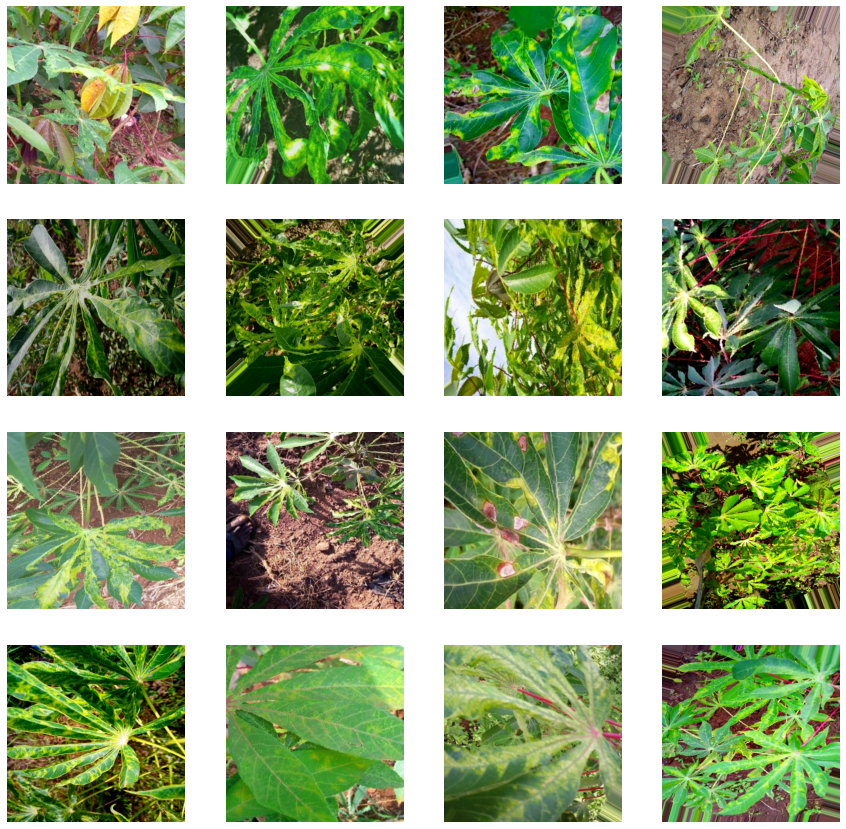

In [26]:
#view augmentation
row = 4; col = 4;
row = min(row,BATCH_SIZE//col)
all_elements = get_dataset(TRAINING_FILENAMES, labeled=True, aug=True,
                           course_drop=False, cutmixup=False, shuffle=True, repeat=True)

all_elements = all_elements.unbatch().batch(20)

for (img,label) in all_elements:
    plt.figure(figsize=(15,15))
    for j in range(16):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

### Coarse dropout-
Simply removes pieces of image

In [32]:
def dropout(image, min_mask_size=(int(HEIGHT * .1), int(HEIGHT * .1)), 
                        max_mask_size=(int(HEIGHT * .125), int(HEIGHT * .125))):
    
#     prob = tf.cast( tf.random.uniform([],0,1)<PROBABILITY, tf.int32)
#     if (prob==0)|(CT==0)|(SZ==0): return image
    
#     for k in range(CT):

#         x = tf.cast( tf.random.uniform([],0,DIM),tf.int32)
#         y = tf.cast( tf.random.uniform([],0,DIM),tf.int32)
#         WIDTH = tf.cast( SZ*DIM,tf.int32) * prob
#         ya = tf.math.maximum(0,y-WIDTH//2)
#         yb = tf.math.minimum(DIM,y+WIDTH//2)
#         xa = tf.math.maximum(0,x-WIDTH//2)
#         xb = tf.math.minimum(DIM,x+WIDTH//2)

#         one = image[ya:yb,0:xa,:]
#         two = tf.zeros([yb-ya,xb-xa,3]) 
#         three = image[ya:yb,xb:DIM,:]
#         middle = tf.concat([one,two,three],axis=1)
#         image = tf.concat([image[0:ya,:,:],middle,image[yb:DIM,:,:]],axis=0)
            
#     image = tf.reshape(image,[DIM,DIM,3])

    p_cutout = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    if p_cutout > .85: # 10~15 cut outs
        n_cutout = tf.random.uniform([], 10, 15, dtype=tf.int32)
        image = random_cutout(image, HEIGHT, WIDTH, 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    elif p_cutout > .6: # 5~10 cut outs
        n_cutout = tf.random.uniform([], 5, 10, dtype=tf.int32)
        image = random_cutout(image, HEIGHT, WIDTH, 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    elif p_cutout > .25: # 2~5 cut outs
        n_cutout = tf.random.uniform([], 2, 5, dtype=tf.int32)
        image = random_cutout(image, HEIGHT, WIDTH, 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    else: # 1 cut out
        image = random_cutout(image, HEIGHT, WIDTH, 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=1)

    return image

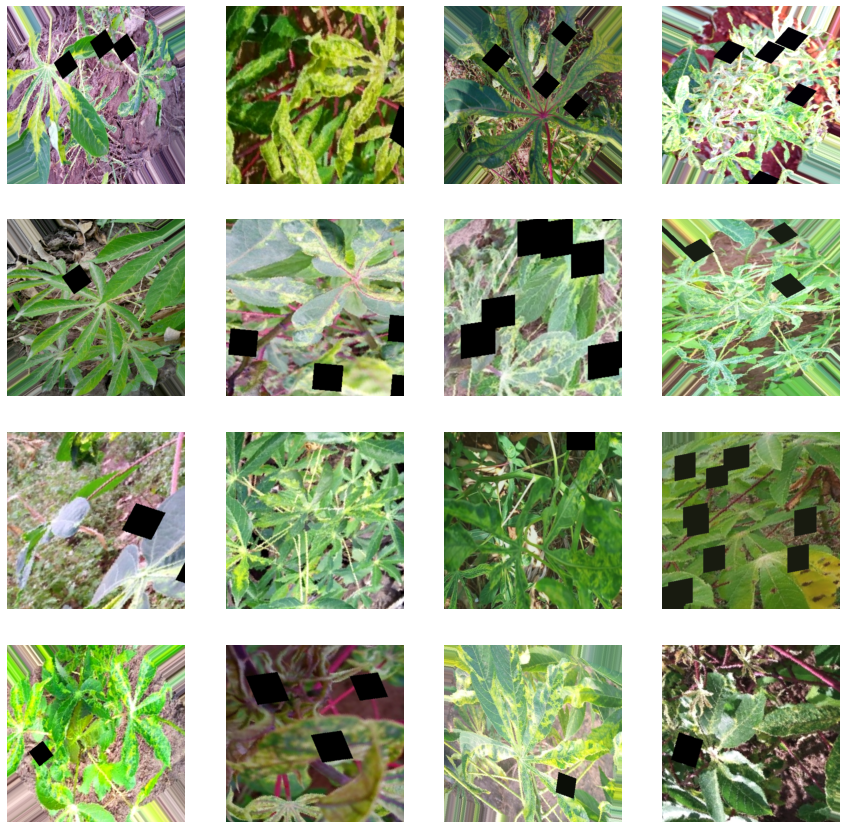

In [42]:
row = 4; col = 4;
row = min(row,BATCH_SIZE//col)
all_elements = get_dataset(TRAINING_FILENAMES, labeled=True, aug=True, cutmixup=False,
                           grid_mask=False, course_drop=True, shuffle=True, repeat=True)

all_elements = all_elements.unbatch().batch(20)

for (img,label) in all_elements:
    plt.figure(figsize=(15,15))
    for j in range(16):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

## GridMask

**Now we can explore GridMask, which is essentially a less randomized Course Dropout. The below code is taken from [this notebook](https://www.kaggle.com/xiejialun/gridmask-data-augmentation-with-tensorflow)**

In [17]:
AugParams = {
    'd1' : 100,
    'd2': 160,
    'rotate' : 45,
    'ratio' : 0.4
}

In [18]:
def transform2(image, inv_mat, image_shape):

    h, w, c = image_shape
    cx, cy = w//2, h//2

    new_xs = tf.repeat( tf.range(-cx, cx, 1), h)
    new_ys = tf.tile( tf.range(-cy, cy, 1), [w])
    new_zs = tf.ones([h*w], dtype=tf.int32)

    old_coords = tf.matmul(inv_mat, tf.cast(tf.stack([new_xs, new_ys, new_zs]), tf.float32))
    old_coords_x, old_coords_y = tf.round(old_coords[0, :] + w//2), tf.round(old_coords[1, :] + h//2)

    clip_mask_x = tf.logical_or(old_coords_x<0, old_coords_x>w-1)
    clip_mask_y = tf.logical_or(old_coords_y<0, old_coords_y>h-1)
    clip_mask = tf.logical_or(clip_mask_x, clip_mask_y)

    old_coords_x = tf.boolean_mask(old_coords_x, tf.logical_not(clip_mask))
    old_coords_y = tf.boolean_mask(old_coords_y, tf.logical_not(clip_mask))
    new_coords_x = tf.boolean_mask(new_xs+cx, tf.logical_not(clip_mask))
    new_coords_y = tf.boolean_mask(new_ys+cy, tf.logical_not(clip_mask))

    old_coords = tf.cast(tf.stack([old_coords_y, old_coords_x]), tf.int32)
    new_coords = tf.cast(tf.stack([new_coords_y, new_coords_x]), tf.int64)
    rotated_image_values = tf.gather_nd(image, tf.transpose(old_coords))
    rotated_image_channel = list()
    for i in range(c):
        vals = rotated_image_values[:,i]
        sparse_channel = tf.SparseTensor(tf.transpose(new_coords), vals, [h, w])
        rotated_image_channel.append(tf.sparse.to_dense(sparse_channel, default_value=0, validate_indices=False))

    return tf.transpose(tf.stack(rotated_image_channel), [1,2,0])

def random_rotate(image, angle, image_shape):

    def get_rotation_mat_inv(angle):
        angle = math.pi * angle / 180

        cos_val = tf.math.cos(angle)
        sin_val = tf.math.sin(angle)
        one = tf.constant([1], tf.float32)
        zero = tf.constant([0], tf.float32)

        rot_mat_inv = tf.concat([cos_val, sin_val, zero,
                                     -sin_val, cos_val, zero,
                                     zero, zero, one], axis=0)
        rot_mat_inv = tf.reshape(rot_mat_inv, [3,3])

        return rot_mat_inv
    angle = float(angle) * tf.random.normal([1],dtype='float32')
    rot_mat_inv = get_rotation_mat_inv(angle)
    return transform2(image, rot_mat_inv, image_shape)


def GridMask(image_height, image_width, d1, d2, rotate_angle=1, ratio=0.5):

    h, w = image_height, image_width
    hh = int(np.ceil(np.sqrt(h*h+w*w)))
    hh = hh+1 if hh%2==1 else hh
    d = tf.random.uniform(shape=[], minval=d1, maxval=d2, dtype=tf.int32)
    l = tf.cast(tf.cast(d,tf.float32)*ratio+0.5, tf.int32)

    st_h = tf.random.uniform(shape=[], minval=0, maxval=d, dtype=tf.int32)
    st_w = tf.random.uniform(shape=[], minval=0, maxval=d, dtype=tf.int32)

    y_ranges = tf.range(-1 * d + st_h, -1 * d + st_h + l)
    x_ranges = tf.range(-1 * d + st_w, -1 * d + st_w + l)

    for i in range(0, hh//d+1):
        s1 = i * d + st_h
        s2 = i * d + st_w
        y_ranges = tf.concat([y_ranges, tf.range(s1,s1+l)], axis=0)
        x_ranges = tf.concat([x_ranges, tf.range(s2,s2+l)], axis=0)

    x_clip_mask = tf.logical_or(x_ranges <0 , x_ranges > hh-1)
    y_clip_mask = tf.logical_or(y_ranges <0 , y_ranges > hh-1)
    clip_mask = tf.logical_or(x_clip_mask, y_clip_mask)

    x_ranges = tf.boolean_mask(x_ranges, tf.logical_not(clip_mask))
    y_ranges = tf.boolean_mask(y_ranges, tf.logical_not(clip_mask))

    hh_ranges = tf.tile(tf.range(0,hh), [tf.cast(tf.reduce_sum(tf.ones_like(x_ranges)), tf.int32)])
    x_ranges = tf.repeat(x_ranges, hh)
    y_ranges = tf.repeat(y_ranges, hh)

    y_hh_indices = tf.transpose(tf.stack([y_ranges, hh_ranges]))
    x_hh_indices = tf.transpose(tf.stack([hh_ranges, x_ranges]))

    y_mask_sparse = tf.SparseTensor(tf.cast(y_hh_indices, tf.int64),  tf.zeros_like(y_ranges), [hh, hh])
    y_mask = tf.sparse.to_dense(y_mask_sparse, 1, False)

    x_mask_sparse = tf.SparseTensor(tf.cast(x_hh_indices, tf.int64), tf.zeros_like(x_ranges), [hh, hh])
    x_mask = tf.sparse.to_dense(x_mask_sparse, 1, False)

    mask = tf.expand_dims( tf.clip_by_value(x_mask + y_mask, 0, 1), axis=-1)

    mask = random_rotate(mask, rotate_angle, [hh, hh, 1])
    mask = tf.image.crop_to_bounding_box(mask, (hh-h)//2, (hh-w)//2, image_height, image_width)

    return mask

def apply_grid_mask(image, label):
    mask = GridMask(IMAGE_SIZE[0],
                    IMAGE_SIZE[1],
                    AugParams['d1'],
                    AugParams['d2'],
                    AugParams['rotate'],
                    AugParams['ratio'])
    
    if IMAGE_SIZE[-1] == 3:
        mask = tf.concat([mask, mask, mask], axis=-1)

    return tf.cast(image * tf.cast(mask, tf.float32), tf.float32), label

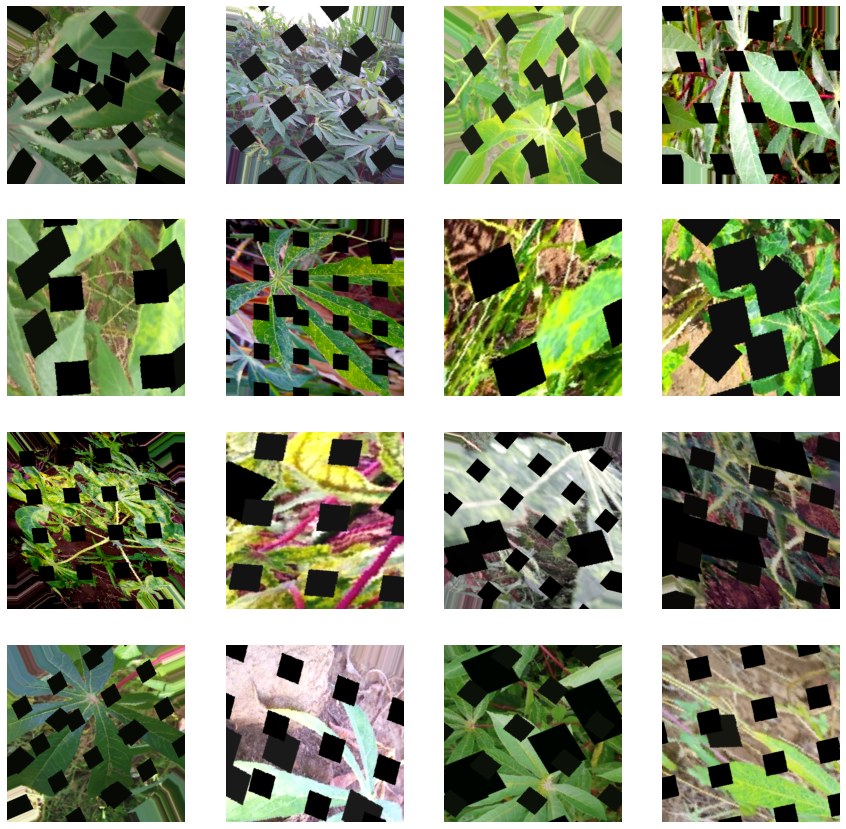

In [40]:
#view what grid mask looks like
row = 4; col = 4;
row = min(row,BATCH_SIZE//col)
all_elements = get_dataset(TRAINING_FILENAMES, labeled=True, grid_mask=True, aug=True,
                           cutmixup=False, course_drop=True, shuffle=True, repeat=True)

all_elements = all_elements.unbatch().batch(20)

for (img,label) in all_elements:
    plt.figure(figsize=(15,15))
    for j in range(16):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

## All The Above

Just applying all good augmentation functions above except for mixup. Doing Mixup separately as me don't want trouble. By the no_grid i have set to false as i think we are loosing too much information in it. In simple coarse dropout we are not gonna lose so much information

In [24]:
# def apply_all_aug(img, label, no_grid = False):
#     p_aug = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
#     p_cutout = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
#     p_none = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
#     if p_none > 0.95:
#         img, label = img, label
#     else: 
#         if p_aug > 0.4:
#             img, label = data_augment(img, label)

#         if p_cutout < 0.3:
#             img = dropout(img, PROBABILITY = 1)

#         if 0.3 < p_cutout < 0.6:
#             img, label = apply_grid_mask(img, label)
        
#     return img, label

def apply_all_aug(img, label, no_grid = True):
    
    if tf.random.uniform([],0,1) > .5:
        if tf.random.uniform([],0,1) > .5:
            img, label = data_augment(img, label)
            
        #apply droupout  
        else:
            img = dropout(img)
            
    else:
        if not no_grid:
        #apply grid mask
            if tf.random.uniform([],0,1) > .5:
                img, label = apply_grid_mask(img, label)
                
            else:
                #do nothing
                img, label = img, label
            
    return img, label

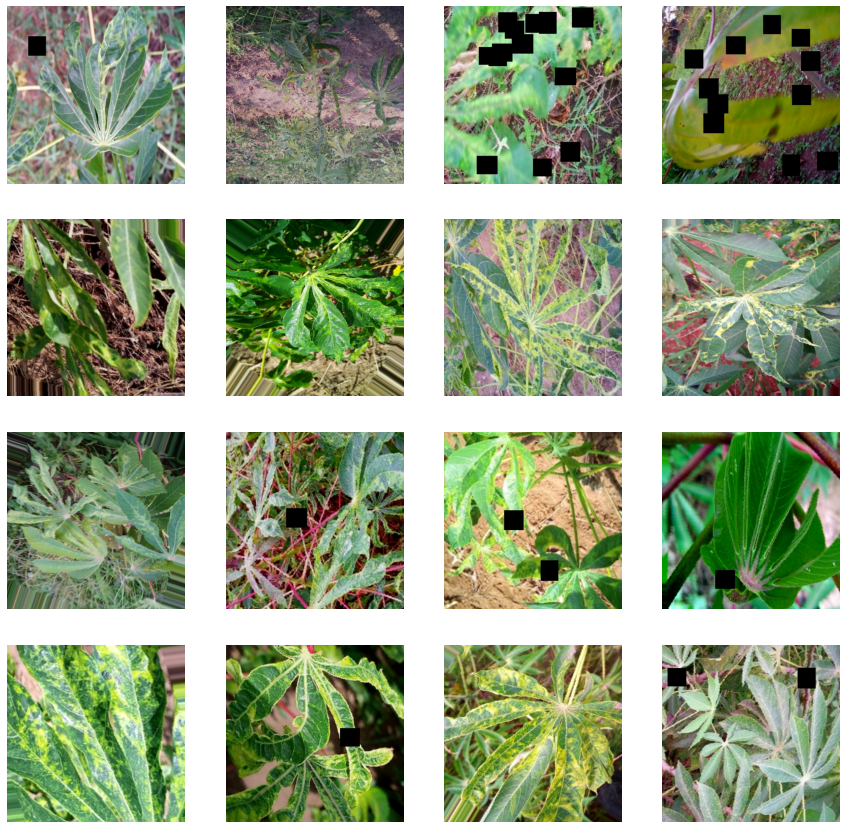

In [25]:
#view what augmentation combination looks like
row = 4; col = 4;
row = min(row,BATCH_SIZE//col)
all_elements = get_dataset(TRAINING_FILENAMES, labeled=True, grid_mask=False, all_aug=True, 
                           course_drop=False, cutmixup=False, shuffle=True, repeat=True)

all_elements = all_elements.unbatch().batch(20)

for (img,label) in all_elements:
    plt.figure(figsize=(15,15))
    for j in range(16):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

#### State of the art mixup augmentations - 

Essentially, all mixup does is randomly converts images to convex combinations of pairs of images and their labels, as seen in the illustration below:

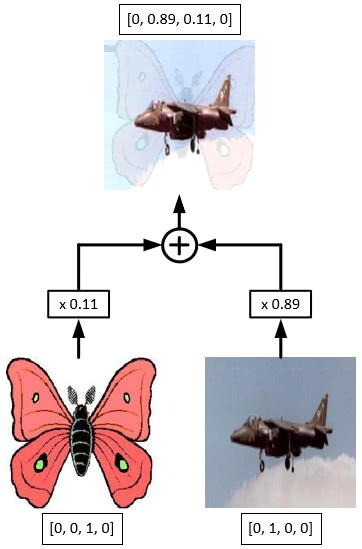

You see the image of the plane and the butterfly have been merged and whichsoever is more prominent in the image has been given a higher label. For mixup we cannot use sparse labels as it distributes probabilities of classes to make a new label. So we will need one hot arrays. 

Now mixup we can do of two types - 

1. Merge pixels one. In which we make one class more prominent than the other in the image.
2. Cutmis which basically takes two images and simply cuts some part of one image onto another - 

**MIXUP**

In [26]:
#need to one hot encode images so we can blend their labels like above
def onehot(image,label):
    CLASSES = len(classes)
    return image,tf.one_hot(label,CLASSES)

def mixup(image, label, PROBABILITY = 1.0, DIM = IMAGE_SIZE[0]):
    CLASSES = len(classes)
    
    imgs = []; labs = []
    for j in range(AUG_BATCH):

        P = tf.cast( tf.random.uniform([],0,1)<=PROBABILITY, tf.float32)

        k = tf.cast( tf.random.uniform([],0,AUG_BATCH),tf.int32)
        a = tf.random.uniform([],0,1)*P

        img1 = image[j,]
        img2 = image[k,]
        imgs.append((1-a)*img1 + a*img2)

        if len(label.shape)==1:
            lab1 = tf.one_hot(label[j],CLASSES)
            lab2 = tf.one_hot(label[k],CLASSES)
        else:
            lab1 = label[j,]
            lab2 = label[k,]
        labs.append((1-a)*lab1 + a*lab2)

    image2 = tf.reshape(tf.stack(imgs),(AUG_BATCH,DIM,DIM,3))
    label2 = tf.reshape(tf.stack(labs),(AUG_BATCH,CLASSES))
    return image2,label2

## CutMix

**CutMix is essentially the same as mixup except the images are not blended together, rather a random sized block of one image is superimposed on another image. You can read more about it [here](http://arxiv.org/pdf/1905.04899.pdf)**

In [27]:
def cutmix(image, label, PROBABILITY = 1.0, DIM = IMAGE_SIZE[0]):

    CLASSES = len(classes)
    
    imgs = []; labs = []
    for j in range(AUG_BATCH):

        P = tf.cast( tf.random.uniform([],0,1)<=PROBABILITY, tf.int32)

        k = tf.cast( tf.random.uniform([],0,AUG_BATCH),tf.int32)

        x = tf.cast( tf.random.uniform([],0,DIM),tf.int32)
        y = tf.cast( tf.random.uniform([],0,DIM),tf.int32)
        b = tf.random.uniform([],0,1)
        WIDTH = tf.cast( DIM * tf.math.sqrt(1-b),tf.int32) * P
        ya = tf.math.maximum(0,y-WIDTH//2)
        yb = tf.math.minimum(DIM,y+WIDTH//2)
        xa = tf.math.maximum(0,x-WIDTH//2)
        xb = tf.math.minimum(DIM,x+WIDTH//2)

        one = image[j,ya:yb,0:xa,:]
        two = image[k,ya:yb,xa:xb,:]
        three = image[j,ya:yb,xb:DIM,:]
        middle = tf.concat([one,two,three],axis=1)
        img = tf.concat([image[j,0:ya,:,:],middle,image[j,yb:DIM,:,:]],axis=0)
        imgs.append(img)

        a = tf.cast(WIDTH*WIDTH/DIM/DIM,tf.float32)
        if len(label.shape)==1:
            lab1 = tf.one_hot(label[j],CLASSES)
            lab2 = tf.one_hot(label[k],CLASSES)
        else:
            lab1 = label[j,]
            lab2 = label[k,]
        labs.append((1-a)*lab1 + a*lab2)
        
    image2 = tf.reshape(tf.stack(imgs),(AUG_BATCH,DIM,DIM,3))
    label2 = tf.reshape(tf.stack(labs),(AUG_BATCH,CLASSES))
    return image2,label2

### MixUp + CutMix

**We can apply CutMix `SWITCH * CUTMIX_PROB` of the time and mixup `(1 - SWITCH) * MIXUP_PROB` of the time. We will need to experiment a bit to see which convex combination delivers the best performance, but this is a good starting point: mixup 33% of the time, CutMix 33% of the time, and no augmentation 33% of the time**

In [33]:
#create function to apply both cutmix and mixup
def cut_and_mix(image, label, DIM = IMAGE_SIZE[0]):
    CLASSES = len(classes)
    
    #define how often we want to do activate cutmix or mixup
    SWITCH = 1/2
    
    #define how often we want cutmix or mixup to activate when switch is active
    CUTMIX_PROB = 2/3
    MIXUP_PROB = 2/3
    
    #apply cutmix and mixup
    image2, label2 = cutmix(image, label, CUTMIX_PROB)
    image3, label3 = mixup(image, label, MIXUP_PROB)
    imgs = []; labs = []
    
    for j in range(BATCH_SIZE):
        P = tf.cast( tf.random.uniform([],0,1)<=SWITCH, tf.float32)
        imgs.append(P*image2[j,]+(1-P)*image3[j,])
        labs.append(P*label2[j,]+(1-P)*label3[j,])
        
    #must explicitly reshape so TPU complier knows output shape
    image4 = tf.reshape(tf.stack(imgs),(BATCH_SIZE,DIM,DIM,3))
    label4 = tf.reshape(tf.stack(labs),(BATCH_SIZE,CLASSES))
    return image4,label4

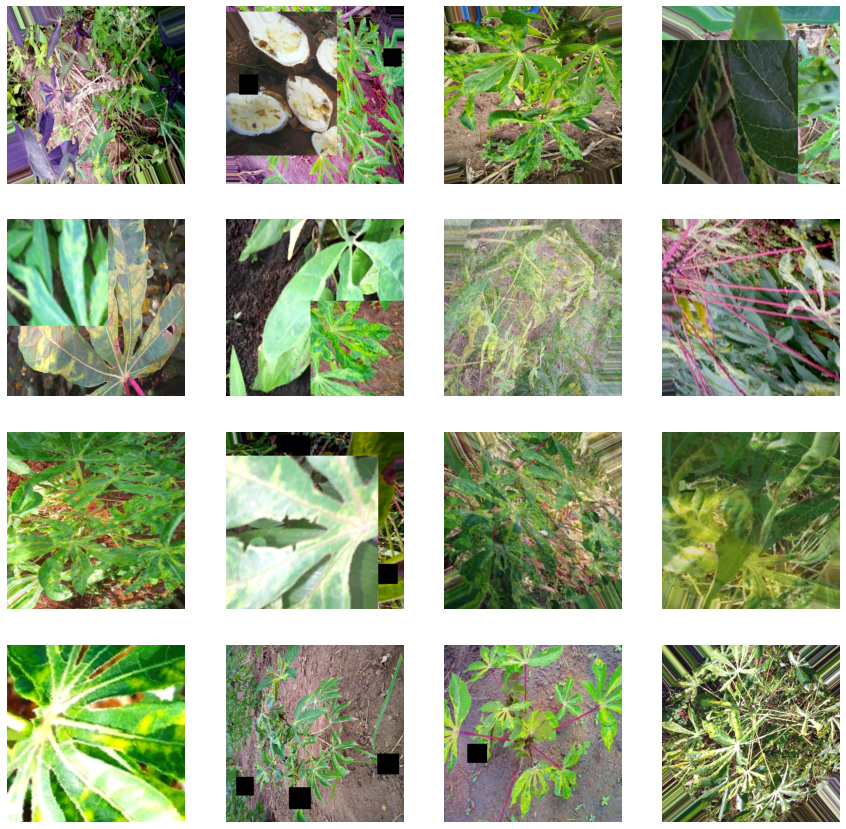

In [29]:
#view what CutMix/MixUp combination looks like
row = 4; col = 4;
row = min(row,BATCH_SIZE//col)
all_elements = get_dataset(TRAINING_FILENAMES, labeled=True, grid_mask=False, all_aug=True,  
                           cutmixup=True, course_drop=False, shuffle=True, repeat=True)

all_elements = all_elements.unbatch().batch(30)

for (img,label) in all_elements:
    plt.figure(figsize=(15,15))
    for j in range(16):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

# 5. Model Training
Learrning rate. Using cosine decay from dimitre oliveras notebook.

Cosine learning rate schedule with a warm-up phase, this may be a good idea since we are using a pre-trained model, the warm-up phase will be useful to avoid the pre-trained weights degradation resulting in catastrophic forgetting, during the schedule the learning rate will slowly decrease to very low values, this helps the model to land on more stable weights.

20 total epochs and 1069 steps per epoch
Learning rate schedule: 1e-08 to 3e-05 to 2.55e-07


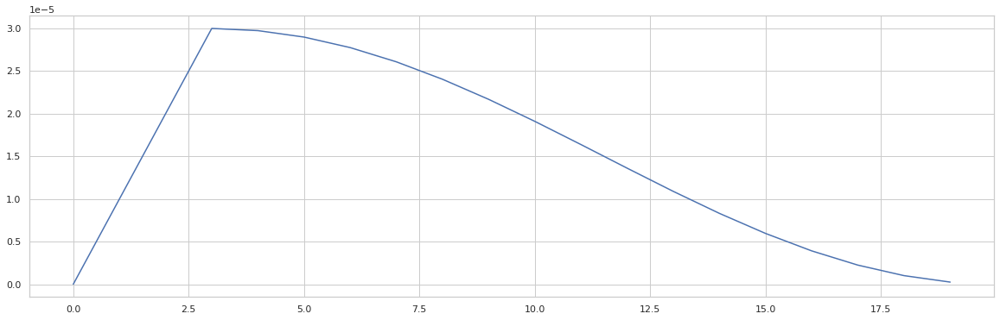

In [41]:
import seaborn as sns
LEARNING_RATE = 3e-5 * REPLICAS
LR_START = 1e-8
LR_MIN = 1e-8
LR_MAX = LEARNING_RATE
LR_RAMPUP_EPOCHS = 3
LR_SUSTAIN_EPOCHS = 0
N_CYCLES = .5


def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        progress = (epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS) / (EPOCHS - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS)
        lr = LR_MAX * (0.5 * (1.0 + tf.math.cos(math.pi * N_CYCLES * 2.0 * progress)))
        if LR_MIN is not None:
            lr = tf.math.maximum(LR_MIN, lr)
            
    return lr

rng = [i for i in range(EPOCHS)]
y = [lrfn(x) for x in rng]

sns.set(style='whitegrid')
fig, ax = plt.subplots(figsize=(20, 6))
plt.plot(rng, y)

print(f'{EPOCHS} total epochs and {NUM_TRAINING_IMAGES//BATCH_SIZE} steps per epoch')
print(f'Learning rate schedule: {y[0]:.3g} to {max(y):.3g} to {y[-1]:.3g}')

In [ ]:
from sklearn.model_selection import KFold

histories = []
oof_pred = []; oof_labels = []

kfold = KFold(FOLDS, shuffle = True, random_state = SEED)

for f, (train_index, val_index) in enumerate(kfold.split(TRAINING_FILENAMES)):
    
    #show fold info
    if DEVICE=='TPU':
        #hack to clear TPU memory
        if tpu: tf.tpu.experimental.initialize_tpu_system(tpu)
    print('#'*25); print('FOLD',f+1); print('#'*25); print('')
    print('Getting datasets...'); print('')
    
    #convert files to datasets
    train_ds = get_dataset(list(pd.DataFrame({'TRAINING_FILENAMES': TRAINING_FILENAMES}).loc[train_index]['TRAINING_FILENAMES']),
                           course_drop=True if AUG_TYPE is 'COURSE_DROP' else False,
                           aug=True if AUG_TYPE is 'MAT_AUG' else False,
                           grid_mask=True if AUG_TYPE is 'GRID_MASK' else False,
                           all_aug=True if AUG_TYPE is 'ATA' else False,
                           cutmixup=True if AUG_TYPE is 'CUTMIXUP' else False,
                           one_hot=False, labeled=True, return_image_names=True, repeat=True, shuffle=True)  

    val_ds = get_dataset(list(pd.DataFrame({'TRAINING_FILENAMES': TRAINING_FILENAMES}).loc[val_index]['TRAINING_FILENAMES']),
                         course_drop=False, mat_aug=False, grid_mask=False, all_aug=False, 
                         cutmixup=False, one_hot=True if AUG_TYPE is 'CUTMIXUP' else False,
                         labeled=True, return_image_names=False, repeat=False, shuffle=False)
    
    sv_loss = tf.keras.callbacks.ModelCheckpoint(f'EFFNET_{f}_{SEED}_{AUG_TYPE}_{IMAGE_SIZE[0]}.h5',
                                                monitor='val_loss',
                                                verbose=VERBOSE,
                                                save_best_only=True,
                                                save_weights_only=True)
    
    sv_acc = tf.keras.callbacks.ModelCheckpoint(f'EFFNET_{f}_{SEED}_{AUG_TYPE}_{IMAGE_SIZE[0]}.h5',
                                                monitor='val_categorical_accuracy' if AUG_TYPE is 'CUTMIXUP' else 'val_sparse_categorical_accuracy',
                                                verbose=VERBOSE,
                                                save_best_only=True,
                                                save_weights_only=True)

    print('Getting model...'); print(''); print('Training model...'); print('')
    
    model = efficientnet(b=4, image_size=IMAGE_SIZE[0], 
                         one_hot=True if AUG_TYPE is 'CUTMIXUP' else False)
        
    #model = densenet(b=1, image_size=IMAGE_SIZE[0], 
                         #one_hot=True if AUG_TYPE is 'CUTMIXUP' else False)
        
    history = model.fit(train_ds, validation_data=val_ds, callbacks=[lr_callback, sv_loss],
                        verbose=VERBOSE, steps_per_epoch=STEPS_PER_EPOCH, epochs=EPOCHS,
    )
    
    model.load_weights(f'EFFNET_{f}_{SEED}_{AUG_TYPE}_{IMAGE_SIZE[0]}.h5')
    model.save(f'EFFNET_{f}_{SEED}_{AUG_TYPE}_{IMAGE_SIZE[0]}_full.h5')
    histories.append(history)
    
    #get OOF predictions
    oof_labels.append([target.numpy() for img, target in iter(val_ds.unbatch())])
    x_oof = val_ds.map(lambda image, image_name: image)
    oof_pred.append(np.argmax(model.predict(x_oof), axis=-1))

    del model; z = gc.collect()
    
    if FIRST_FOLD_ONLY:
        break

In [ ]:
def plot_learning_curves(histories, one_hot = False): 
    fig, ax = plt.subplots(1, 2, figsize = (20, 10))
    
    if one_hot:
        for i in range(0, 3):
            ax[0].plot(histories[i].history['categorical_accuracy'], color = 'C0')
            ax[0].plot(histories[i].history['val_categorical_accuracy'], color = 'C1')

    else:
        for i in range(0, 3):
            ax[0].plot(histories[i].history['sparse_categorical_accuracy'], color = 'C0')
            ax[0].plot(histories[i].history['val_sparse_categorical_accuracy'], color = 'C1')

    for i in range(0, 3):
        ax[1].plot(histories[i].history['loss'], color = 'C0')
        ax[1].plot(histories[i].history['val_loss'], color = 'C1')

    ax[0].legend(['train', 'validation'], loc = 'upper left')
    ax[1].legend(['train', 'validation'], loc = 'upper right')
    
    fig.suptitle("Model Performance", fontsize=14)
    
    for i in range(0,2):
        ax[0].set_ylabel('Accuracy')
        ax[0].set_xlabel('Epoch')
        ax[1].set_ylabel('Loss')
        ax[1].set_xlabel('Epoch')

    return plt.show()

In [ ]:
if not FIRST_FOLD_ONLY:
    plot_learning_curves(histories, one_hot=True if AUG_TYPE is 'CUTMIXUP' else False)

In [ ]:
y_true = np.concatenate(oof_labels)
y_preds = np.concatenate(oof_pred)

print(classification_report(np.argmax(y_true, axis=1) if AUG_TYPE is 'CUTMIXUP' else y_true, y_preds))
print(f"OOF accuracy score: {accuracy_score(np.argmax(y_true, axis=1) if AUG_TYPE is 'CUTMIXUP' else y_true, y_preds)}")